In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure, morphology
from cellpose import io
import matplotlib.pyplot as plt
from scipy.ndimage import label
from skimage.measure import regionprops


file_path = "/Users/demir/Documents/Hva_AI/afstudeerproject/E35_tif/20240312_CKR_Exp35_STHdhQ97HA_96h_+BafA_CCT1_635P_HA_580_A11_460L_3.tif"
img = io.imread(file_path) # (9, 4, 1024, 1024)
print(f'img       : {img.shape}')

img_nuclei = img[:, 0, :, :]
img_aggregate = img[:, 2, :, :]
img_cellbody = img[:, 3, :, :]

print(f'Nuclei    : {img_nuclei.shape} \nAggregate : {img_aggregate.shape} \nCell body : {img_cellbody.shape}')

def process_aggregates(img):
    aggregate_masks = []
    for z_slice in range(img.shape[0]):     # img.shape[0] = Z-slices information
        slice_img = img[z_slice, 2, :, :]   # Channel 2 for aggregates
        threshold = 0.55 * np.max(slice_img)
        bright_spots = slice_img > threshold
        clean_mask = morphology.remove_small_objects(bright_spots, min_size=9) # Bu parametrede degistirilebilir olsun.
        aggregate_masks.append(clean_mask)
    return aggregate_masks

aggregate_masks = process_aggregates(img)
aggregate_stack = np.stack(aggregate_masks, axis=0)  # shape: (Z, Y, X)

labeled_aggregates, num_aggregates = label(aggregate_stack)

for i, labeled_slice in enumerate(labeled_aggregates):
    props = regionprops(labeled_slice)
    num_aggregates_z = len(props)  # Agregat sayısı, regionprops ile hesaplanır
    print(f"Z-slice {i+1}: {num_aggregates_z} agg")



Welcome to CellposeSAM, cellpose v4.0.1! The neural network component of
CPSAM is much larger than in previous versions and CPU excution is slow. 
We encourage users to use GPU/MPS if available. 




100%|██████████| 44/44 [00:00<00:00, 516.32it/s]


img       : (11, 4, 1024, 1024)
Nuclei    : (11, 1024, 1024) 
Aggregate : (11, 1024, 1024) 
Cell body : (11, 1024, 1024)
Z-slice 1: 4 agg
Z-slice 2: 3 agg
Z-slice 3: 5 agg
Z-slice 4: 18 agg
Z-slice 5: 35 agg
Z-slice 6: 26 agg
Z-slice 7: 11 agg
Z-slice 8: 5 agg
Z-slice 9: 8 agg
Z-slice 10: 3 agg
Z-slice 11: 2 agg


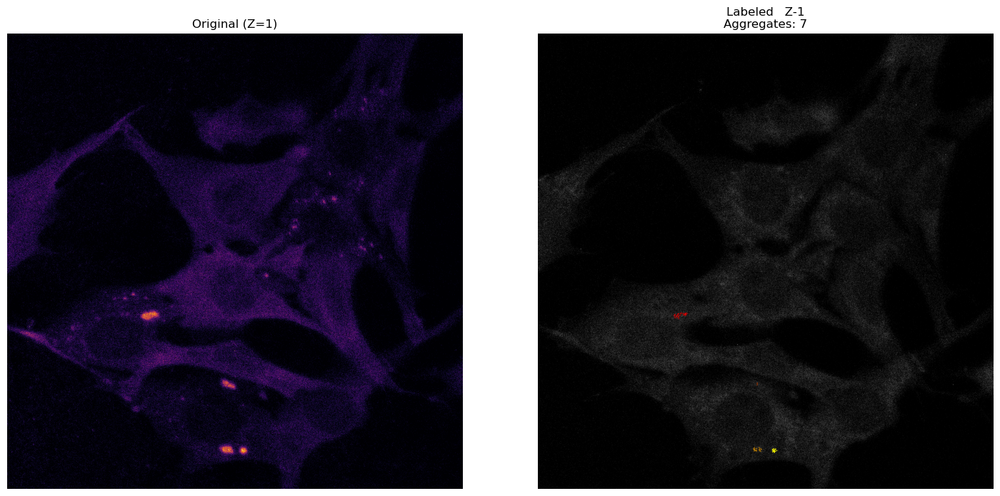

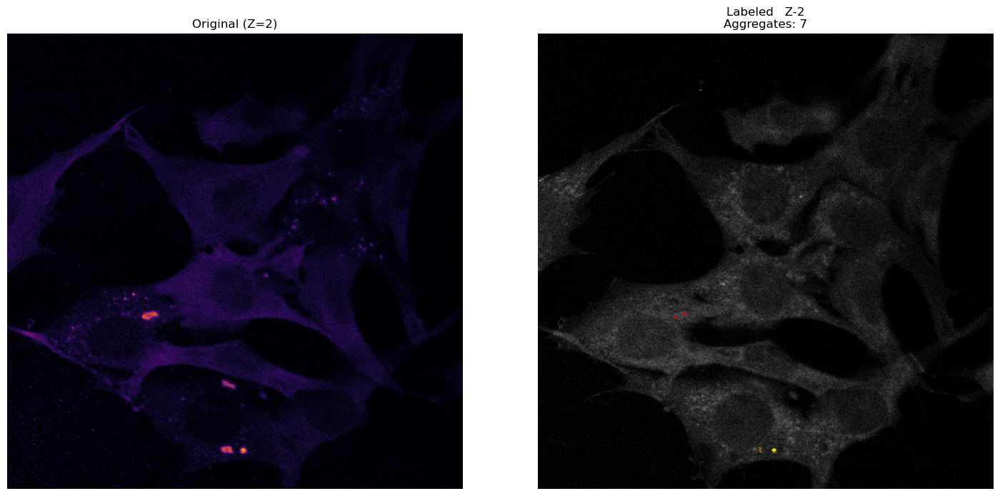

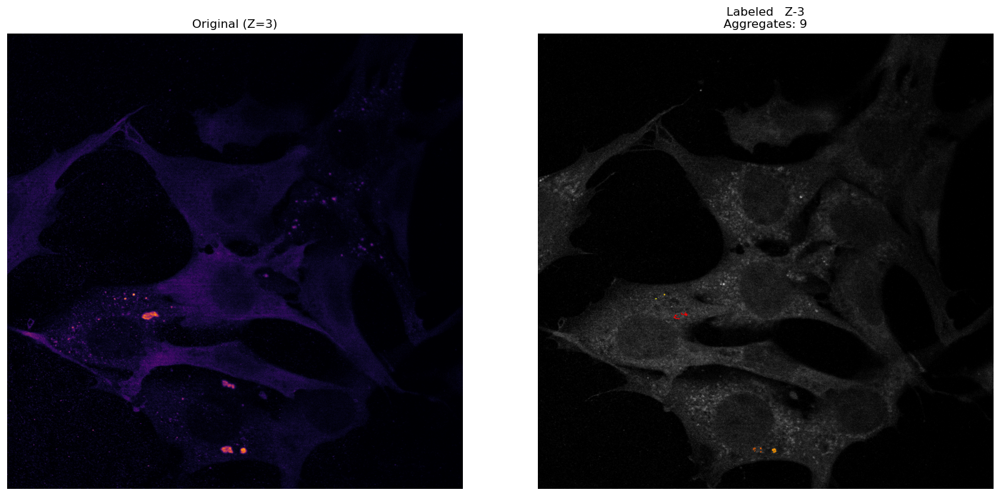

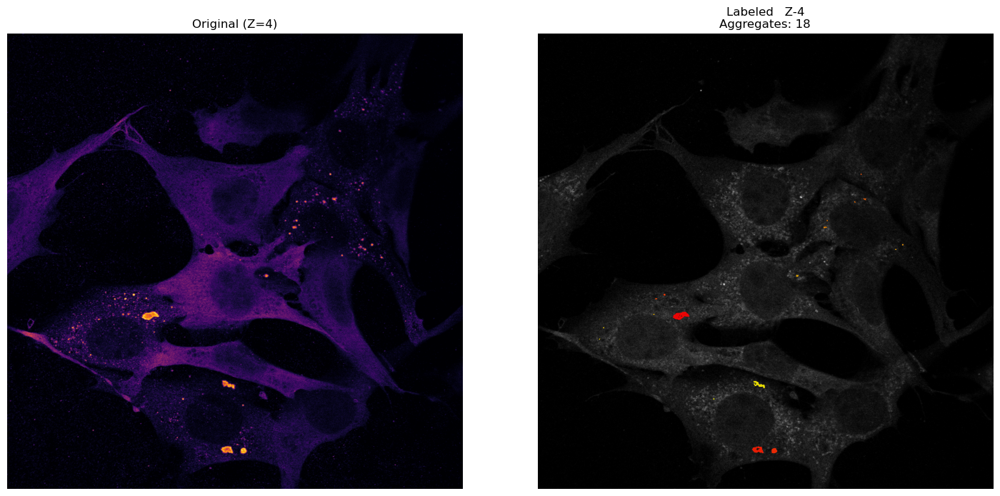

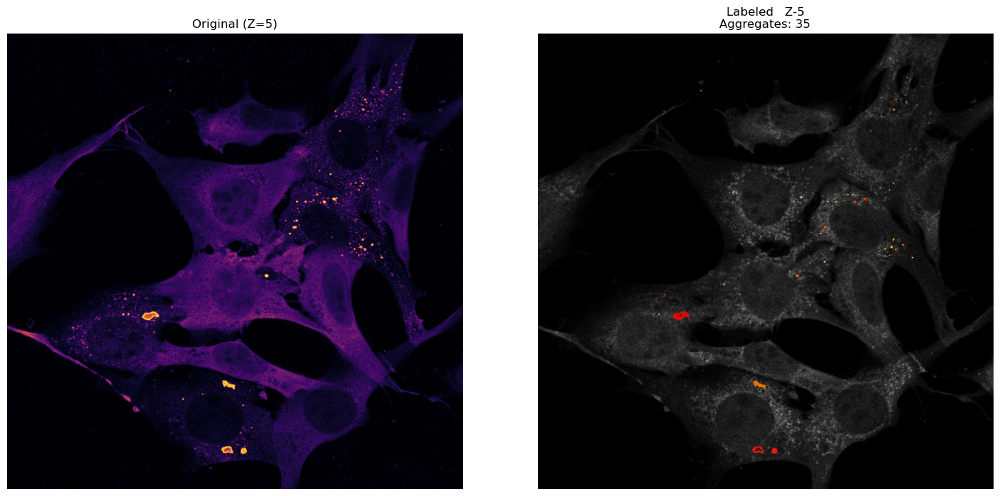

...

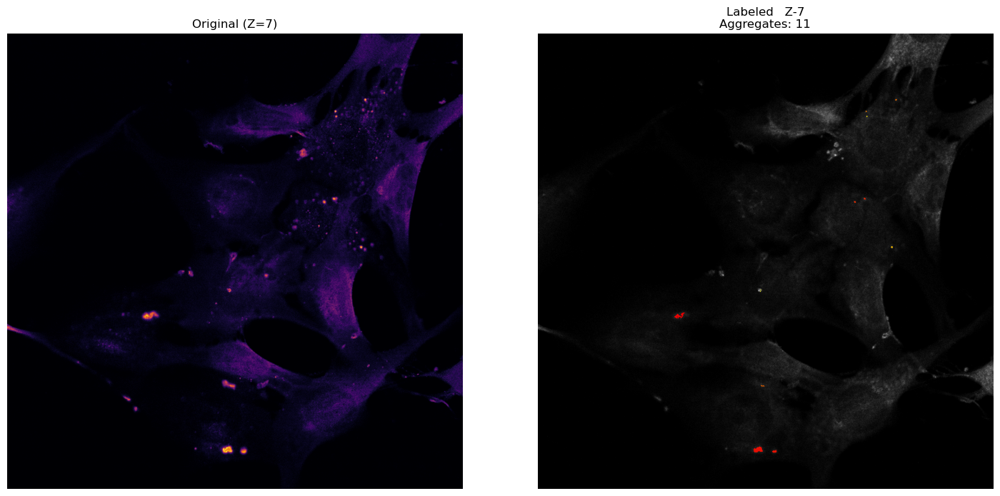

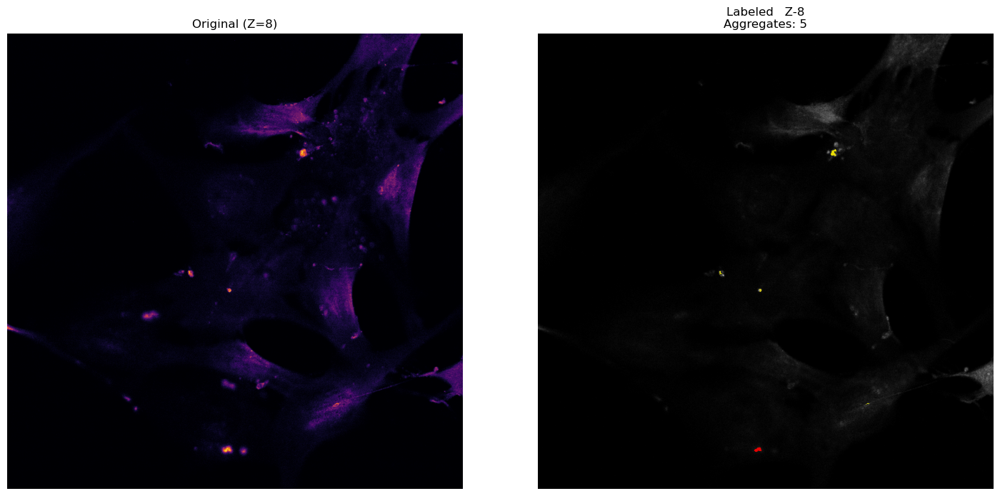

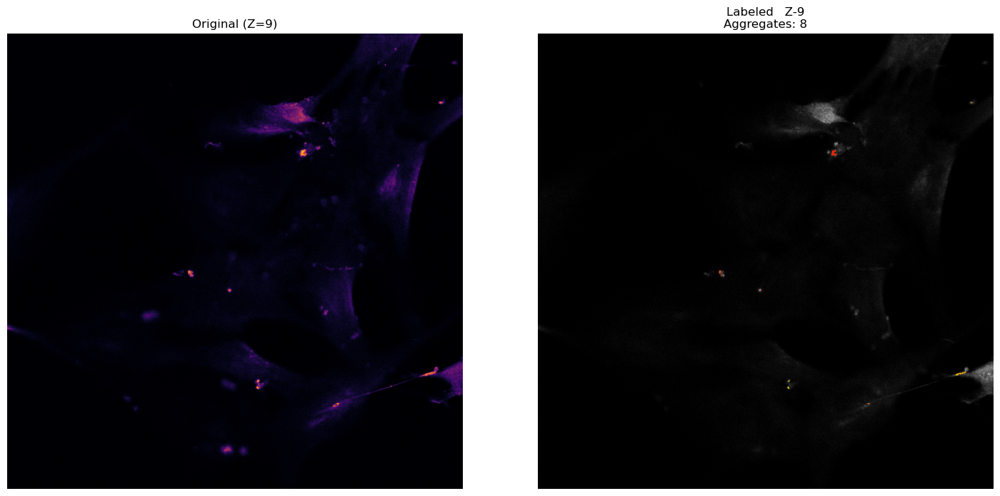

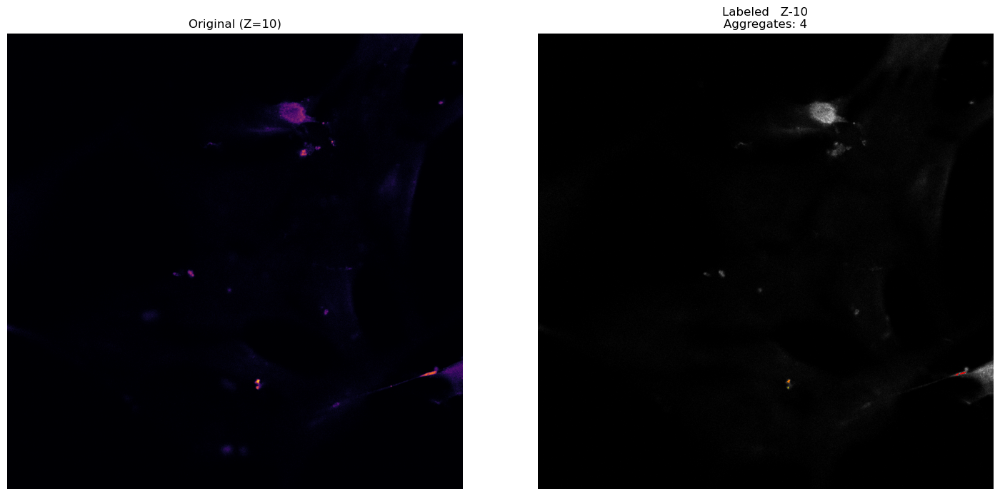

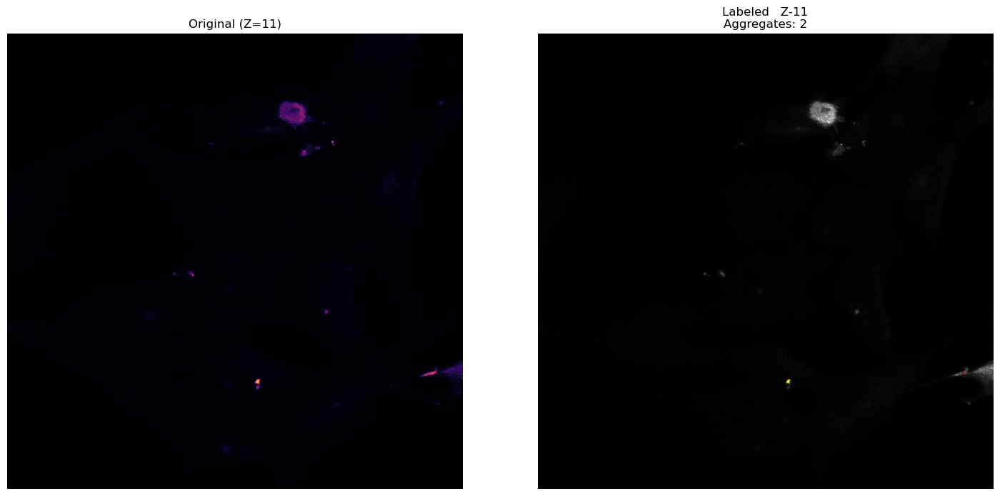

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.measure import regionprops
from scipy.ndimage import label
from skimage import morphology

# Görselleştirme: Her Z-slice için orijinal ve etiketli agregatları yan yana
for z_slice in range(img.shape[0]):
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))

    # Orijinal C2
    axes[0].imshow(img[z_slice, 2, :, :], cmap='inferno')  #bone  magma     inferno  plasma
    axes[0].set_title(f'Original (Z={z_slice+1})')
    axes[0].axis('off')

    # Agregatları renkli olarak eklemek
    labeled_slice = labeled_aggregates[z_slice, :, :]
    labeled_overlay = np.ma.masked_where(labeled_slice == 0, labeled_slice)

    cell_img = img[z_slice, 3, :, :]  # Cell Body
    
    # 2 FOTOS 
    axes[1].imshow(cell_img, cmap='gray')   # Cell Body Channel
    axes[1].imshow(labeled_overlay, cmap='autumn', alpha=0.9)  # autumn   afmhot   hot    

    # Agregat sayısını yazma (bu sadece o Z-slice için)
    labeled_slice = label(labeled_slice.astype(np.uint8))  # Etiketleri tam sayıya dönüştürme
    props = regionprops(labeled_slice[0])  # `label` fonksiyonu 2 öğe döner (etiketli görüntü ve sayı)
    num_aggregates_z = len(props)  # Agregat sayısı, regionprops ile hesaplanır
    
    axes[1].set_title(f'Labeled   Z-{z_slice+1}\nAggregates: {num_aggregates_z}')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


In [3]:
import pandas as pd
from skimage.measure import regionprops

# Önemli: intensity_image olarak aynı boyutta C2 (aggregate) kanalı verilmeli
props = regionprops(labeled_aggregates, intensity_image=img_aggregate)

df = pd.DataFrame([{
    'id': r.label,
    'volume': r.area,
    'centroid_z': round(r.centroid[0], 1),
    'centroid_y': round(r.centroid[1], 1),
    'centroid_x': round(r.centroid[2], 1),
    'mean_intensity': round(r.mean_intensity, 1),
    'total_intensity': round(r.intensity_image.sum(), 1),
} for i, r in enumerate(props)])

df.to_csv("aggregates_summary.csv", index=False)
